# Filtros Espaciais #
* Tópicos
1. Filtragem

    1.1 Filtro de média

    1.2 Filtro de mediana

    1.3 Filtro de máximo

    1.4 Filtro mínimo

2. Detecção de borda

    2.1 Filtros de Primeira Derivada

        2.1.1 Filtro Sobel

        2.1.2 Filtro Prewitt

        2.1.3 Filtro Canny

    2.2 Filtros de Segunda Derivada

        2.2.1 Filtro Laplaciano

        2.2.2 Filtro Laplaciano do Gaussiano

    2.3 Filtro de Detecção de Forma
    

## Introdução

Vamos começar o processamento de imagens analisando, primeiramente, os filtros. Os filtros são utilizados, em processamento de imagens, para remover elementos indesejados como ruído. Os filtros também podem ser utilizados para destacar elementos específicos em uma imagem e suprimir ou atenuar outros. 

Inicialmente podemos agrupar os filtros lineares e não lineares. Entretanto os filtros podem ser agrupados também por outros critérios.  Em alguns casos, por exemplo, o aprimoramento da imagem pode ser realizado no domínio espacial e outros pode-se trabalhar  no domínio da frequência. 

Começamos neste seção, com técnicas de realce e aprimoramento de imagem utilizando filtros lineares no domínio espacial.  O domínio espacial trabalha diretamente com todos os pixels que constituem uma imagem. As distâncias na imagem (em pixels) correspondem às distâncias reais em micrômetros, polegadas, etc.  

Los exemplos nas próximas células utilizam, principalmente, recursos disponíveis nos módulos [scikits](https://scikit-image.org) e [scipy](https://docs.scipy.org/doc/).

In [1]:
import cv2 as cv
print("OpenCV: ", cv.__version__)
import numpy as np
print("numpy: ", np.__version__)
import scipy
print( "scipy: ", scipy.__version__)
import skimage
print( "scikit-image: ", skimage.__version__)
import matplotlib
print("matplotlib: ", matplotlib.__version__)
import PIL
print("PIL: ", PIL.__version__)

import scipy.ndimage
import scipy.misc
import matplotlib.pyplot as plt
plt.style.use('classic')
#%matplotlib
#%matplotlib notebook
#%matplotlib inline
%matplotlib widget
from PIL import Image
from skimage import filters
from skimage.data import camera

OpenCV:  4.7.0
numpy:  1.24.2
scipy:  1.9.1
scikit-image:  0.20.0
matplotlib:  3.6.3
PIL:  9.4.0


Nos próximos exemplos utilizaremos uma imagem para ilustrar as ferramentas que serão apresentadas

In [2]:
img = cv.imread('Imagens/image1.png')

In [3]:
print(img.shape)

(1086, 663, 3)


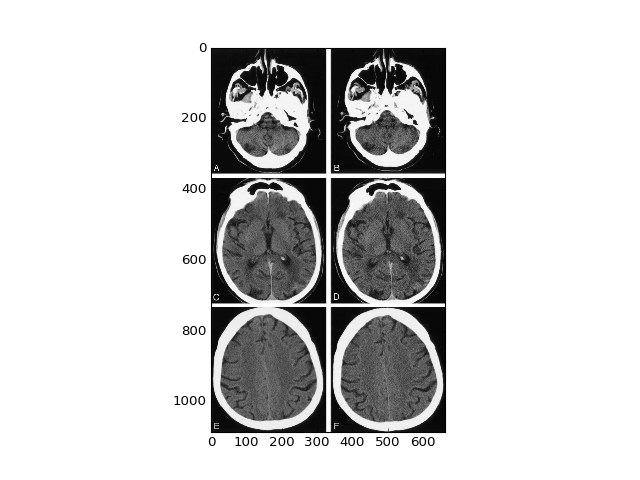

In [4]:
fig = plt.figure()
ax = plt.axes()
ax.imshow(img, 'gray')

Utilizaremos também algumas versões da imagem original com diferentes tipos de ruído. 

In [5]:

#fonte: https://stackoverflow.com/questions/22937589/how-to-add-noise-gaussian-salt-and-pepper-etc-to-image-in-python-with-opencv
def noisy(noise_typ,image):
    if noise_typ == "gauss":
        row,col= image.shape
        mean = 0
        var = 0.2
        sigma = var**0.5
        gauss = np.random.normal(mean,sigma,(row,col))
        gauss = gauss.reshape(row,col)
        noisy = image + gauss
        #noisy = normImg(noisy)
        return noisy
    elif noise_typ == "s&p":
        row,col = image.shape
        s_vs_p = 0.5
        amount = 0.04
        out = np.copy(image)
        
        # Salt mode
        num_salt = np.ceil(amount * image.size * s_vs_p)
        coords = [np.random.randint(0, i - 1, int(num_salt))
                  for i in image.shape]
        for i in range(len(coords[0])):
            out[coords[0][i], coords[1][i]]  = 255
        
        # Pepper mode
        num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
        coords = [np.random.randint(0, i - 1, int(num_pepper))
                  for i in image.shape]
        for i in range(len(coords[0])):
            out[coords[0][i], coords[1][i]]  = 0
        return out
    elif noise_typ == "poisson":
        vals = len(np.unique(image))
        vals = 2 ** np.ceil(np.log2(vals))
        noisy = np.random.poisson(image * vals) / float(vals)
        return noisy
    elif noise_typ =="speckle":
        row,col = image.shape
        gauss = np.random.randn(row,col)
        gauss = gauss.reshape(row,col)
        noisy = image + image * gauss
        return noisy

(-0.5, 662.5, 1085.5, -0.5)

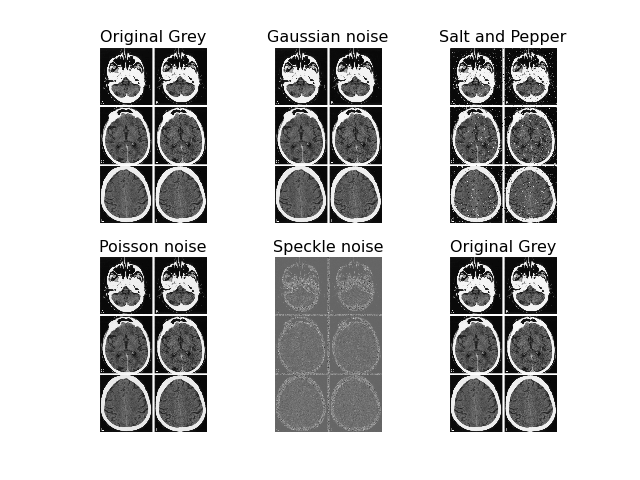

In [6]:
# Converting the image to grayscale.
imgG = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Exemplos de imagens com diferentes tipos de ruido
imgGauss = noisy("gauss", imgG)
imgSP = noisy("s&p", imgG)
imgPoisson = noisy("poisson", imgG)
imgSpeckle = noisy("speckle", imgG)


fig, ax = plt.subplots(2,3)
ax[0, 0].imshow(img)
ax[0, 0].set_title('Original Grey')
ax[0, 0].axis('off')
ax[0, 1].imshow(imgGauss, cmap='gray')
ax[0, 1].set_title('Gaussian noise')
ax[0, 1].axis('off')
ax[0, 2].imshow(imgSP, cmap='gray')
ax[0, 2].set_title('Salt and Pepper')
ax[0, 2].axis('off')
ax[1, 0].imshow(imgPoisson, cmap='gray')
ax[1, 0].set_title('Poisson noise')
ax[1, 0].axis('off')
ax[1, 1].imshow(imgSpeckle, cmap='gray')
ax[1, 1].set_title('Speckle noise')
ax[1, 1].axis('off')
ax[1, 2].imshow(img)
ax[1, 2].set_title('Original Grey')
ax[1, 2].axis('off')

## Filtrando uma imagem no domínio espacial

Cada filtro tem uma utilidade específica e é projetado para remover um tipo de ruído ou realçar certos aspectos da imagem. Para este fim é utilizada uma máscara, geralmente uma janela quadrada bidimensional, que se move pela imagem afetando apenas um pixel por vez. Cada número na mascar é conhecido como um coeficiente. Os coeficientes no filtro determinam os efeitos do filtro e, conseqüentemente, a imagem de saída.

O funcionamento do filtro pode ser explicado de forma simples.  Para cada pixel (i,j) da imagem, uma sub-imagem em torno do mesmo, da mesma dimensão da mascara do filtro, é considerada para filtragem. O centro do filtro é sobreposto ao pixel (i, j). Os pixels na subimagem são multiplicados com os coeficientes correspondentes no filtro. Isso produz uma matriz do mesmo tamanho que o filtro. A matriz é simplificada usando uma equação matemática para obter um único valor que substituirá o valor do pixel em (i, j) da imagem. A natureza exata da equação matemática depende do tipo de filtro. A imagem filtrada é obtida repetindo o processo de colocação do filtro em cada pixel da imagem original, obtendo o valor único e substituindo o novo valor do pixel na imagem original. Esse processo de deslizar uma janela de filtro sobre uma imagem é chamado de convolução no domínio espacial.

A operação de convolução deve ser executada em todos os pixels da imagem, incluindo os pixels no limite da imagem. Quando o filtro é colocado nos pixels do limite, uma parte do filtro ficará fora do limite. Como os valores de pixel não existem fora do limite, novos valores devem ser criados antes da convolução. Esse processo de criação de valores de pixel fora do limite é chamado de preenchimento (padding). Os pixels preenchidos podem ser considerados zero ou um valor constante. Outras opções de preenchimento, como vizinho mais próximo ou reflexo, criam pixels preenchidos usando valores de pixel na imagem. No caso de zeros, os pixels preenchidos são todos zeros. No caso de constante, os pixels preenchidos assumem um valor específico. No caso de reflexão, os pixels preenchidos assumem o valor da(s) última(s) linha(s) ou coluna(s). Os pixels preenchidos são considerados apenas para convolução e serão descartados após a convolução.

Muitos dos recursos já implementados em pyhon incluem os diferentes tipos de preenchimento. A modo de exemplo veja, nos exemplos a seguir, algumas implementações simples de preenchimentos que foram discutidas como parte dos exemplos de uso do módulo Numpy.

In [7]:
# um exmplo de simples de imagem
imgPad = img[0:5,0:7,0].copy()
print(imgPad.shape)
print(type(imgPad[0,0]))
print("Imagem")
print(imgPad)
# Criando uma mascara 5x5 para o filtro
filMasc = np.ones((5,5))
print("Mascara do filtro")
print(filMasc)
#Criando uma image extendida
h,l = imgPad.shape
imgZeroPad = np.zeros((h+4, l+4), dtype=np.uint8)
imgZeroPad[2:h+2, 2:l+2] = imgPad[:,:]
print("Matriz extendida: Zero padding:")
print(imgZeroPad)
imgConstPad = np.full((h+4, l+4), 128, dtype=np.uint8)
imgConstPad[2:h+2, 2:l+2] = imgPad[:,:]
print("Matriz extendida: Constant padding:")
print(imgConstPad)
imgNearPad = np.ones((h+4, l+4), dtype=np.uint8)
imgNearPad[2:h+2, 2:l+2] = imgPad[:,:]
imgNearPad[0, 2:l+2] = imgNearPad[2, 2:l+2]
imgNearPad[1, 2:l+2] = imgNearPad[2, 2:l+2]
imgNearPad[-1, 2:l+2] = imgNearPad[-3, 2:l+2]
imgNearPad[-2, 2:l+2] = imgNearPad[-3, 2:l+2]
imgNearPad[2:h+2, 0] = imgNearPad[2:h+2, 2]
imgNearPad[2:h+2, 1] = imgNearPad[2:h+2, 2]
imgNearPad[2:h+2, -1] = imgNearPad[2:h+2, -3]
imgNearPad[2:h+2, -2] = imgNearPad[2:h+2, -3]
imgNearPad[:2, :2] = imgNearPad[2, 2]*imgNearPad[:2, :2] 
imgNearPad[:2, -2:] = imgNearPad[2, -3]*imgNearPad[:2, -2:] 
imgNearPad[-2:, :2] = imgNearPad[-3, 2]*imgNearPad[-2:, :2] 
imgNearPad[-2:, -2:] = imgNearPad[-3, -3]*imgNearPad[-2:, -2:] 
print("Matriz extendida: Nearest padding:")
print(imgNearPad)

(5, 7)
<class 'numpy.uint8'>
Imagem
[[64 54 44 42 40 38 36]
 [62 52 42 38 38 34 32]
 [58 48 38 34 32 28 26]
 [58 46 36 32 30 26 22]
 [58 46 36 32 28 24 22]]
Mascara do filtro
[[1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]]
Matriz extendida: Zero padding:
[[ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0 64 54 44 42 40 38 36  0  0]
 [ 0  0 62 52 42 38 38 34 32  0  0]
 [ 0  0 58 48 38 34 32 28 26  0  0]
 [ 0  0 58 46 36 32 30 26 22  0  0]
 [ 0  0 58 46 36 32 28 24 22  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0]]
Matriz extendida: Constant padding:
[[128 128 128 128 128 128 128 128 128 128 128]
 [128 128 128 128 128 128 128 128 128 128 128]
 [128 128  64  54  44  42  40  38  36 128 128]
 [128 128  62  52  42  38  38  34  32 128 128]
 [128 128  58  48  38  34  32  28  26 128 128]
 [128 128  58  46  36  32  30  26  22 128 128]
 [128 128  58  46  36  32  28  24  22 128 128]
 [128 128 12

### Filtro de média

O filtro de média é, basicamente, um filtro linear desenhado para atuar no domínio espacial. A máscara deste filtro é uma matriz com todos os coeficientes iguais a um. Os pixels modificados pela mascara são combinados via adição simples e, posteriormente, o resultado é dividido pelo total de pixels na máscara. Pela sua simplicidade este filtro não costuma ter uma implementação específica. Entretanto a modulo [scipy.ndimage](https://docs.scipy.org/doc/scipy-1.9.1/reference/generated/scipy.ndimage.convolve.html?highlight=ndimage%20convolve#scipy.ndimage.convolve) disponibiliza uma forma prática para aplicar o mesmo. 

In [8]:
help(scipy.ndimage.convolve)

Help on function convolve in module scipy.ndimage._filters:

convolve(input, weights, output=None, mode='reflect', cval=0.0, origin=0)
    Multidimensional convolution.
    
    The array is convolved with the given kernel.
    
    Parameters
    ----------
    input : array_like
        The input array.
    weights : array_like
        Array of weights, same number of dimensions as input
    output : array or dtype, optional
        The array in which to place the output, or the dtype of the
        returned array. By default an array of the same dtype as input
        will be created.
    mode : {'reflect', 'constant', 'nearest', 'mirror', 'wrap'}, optional
        The `mode` parameter determines how the input array is extended
        beyond its boundaries. Default is 'reflect'. Behavior for each valid
        value is as follows:
    
        'reflect' (`d c b a | a b c d | d c b a`)
            The input is extended by reflecting about the edge of the last
            pixel. This

(-0.5, 662.5, 1085.5, -0.5)

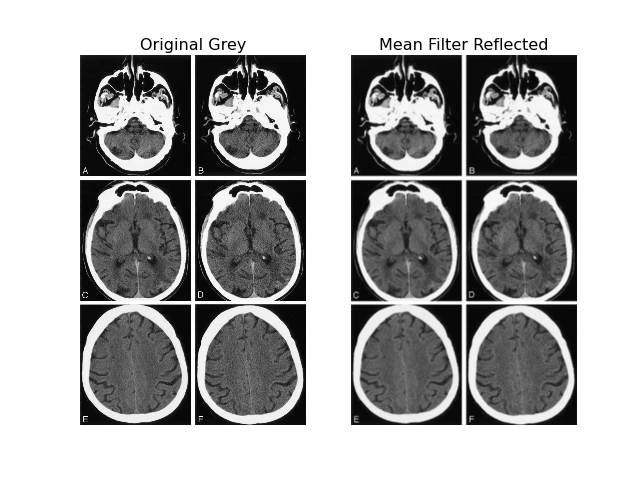

In [9]:
# The filter is divided by 25 for normalization.
k = np.ones((5,5))/25
# performing convolution
imgMeanF1 = scipy.ndimage.convolve(imgGauss, k) #mode='reflect'
# Writing img to a file.
#cv.imwrite("image_meanFilter.png", imgMeanF1)

fig, ax = plt.subplots(1,2)
ax[0].imshow(imgGauss, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Grey')
ax[0].axis('off')
ax[1].imshow(imgMeanF1, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Mean Filter Reflected')
ax[1].axis('off')

(-0.5, 662.5, 1085.5, -0.5)

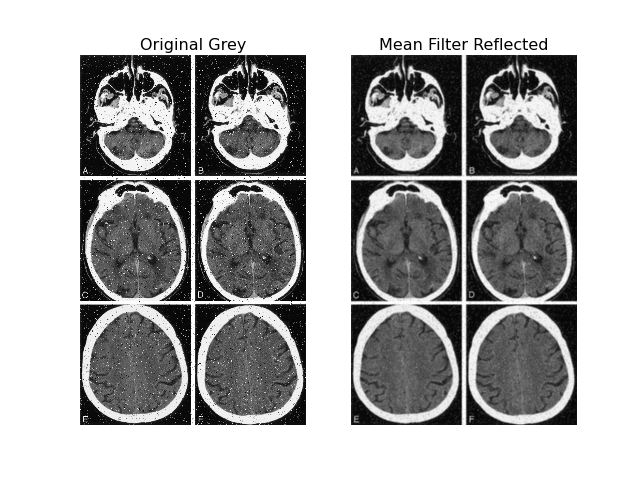

In [10]:
# performing convolution
imgMeanF1 = scipy.ndimage.convolve(imgSP, k) #mode='reflect'

fig, ax = plt.subplots(1,2)
ax[0].imshow(imgSP, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Grey')
ax[0].axis('off')
ax[1].imshow(imgMeanF1, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Mean Filter Reflected')
ax[1].axis('off')

(-0.5, 662.5, 1085.5, -0.5)

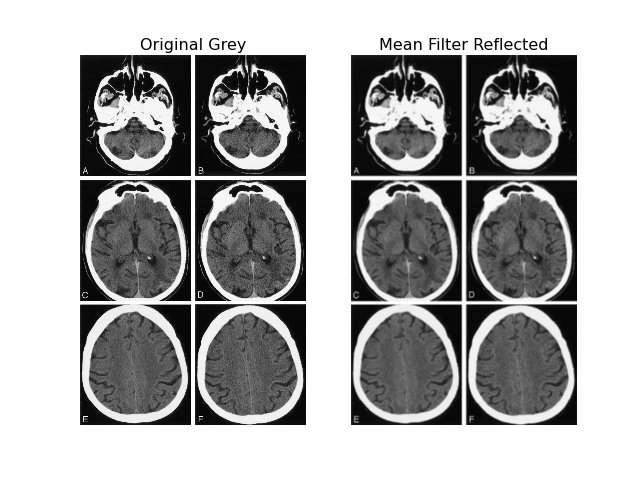

In [11]:
# performing convolution
imgMeanF1 = scipy.ndimage.convolve(imgPoisson, k) #mode='reflect'

fig, ax = plt.subplots(1,2)
ax[0].imshow(imgPoisson, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Grey')
ax[0].axis('off')
ax[1].imshow(imgMeanF1, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Mean Filter Reflected')
ax[1].axis('off')

(-0.5, 662.5, 1085.5, -0.5)

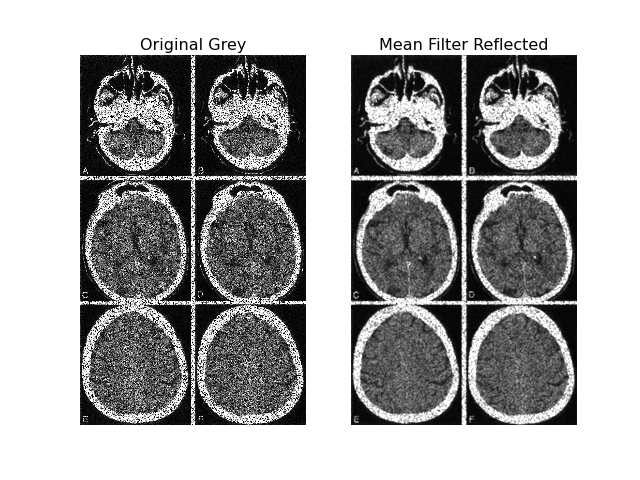

In [12]:
# performing convolution
imgMeanF1 = scipy.ndimage.convolve(imgSpeckle, k) #mode='reflect'

fig, ax = plt.subplots(1,2)
ax[0].imshow(imgSpeckle, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Grey')
ax[0].axis('off')
ax[1].imshow(imgMeanF1, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Mean Filter Reflected')
ax[1].axis('off')

(-0.5, 662.5, 1085.5, -0.5)

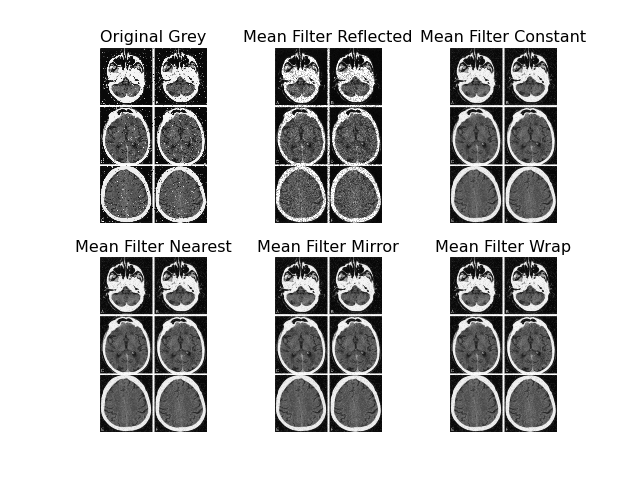

In [13]:
# Utilizando outras técnicas de padding
# {'reflect', 'constant', 'nearest', 'mirror', 'wrap'}
imgMeanF2 = scipy.ndimage.convolve(imgSP, k, mode='constant', cval=128)
imgMeanF3 = scipy.ndimage.convolve(imgSP, k, mode='nearest' )
imgMeanF4 = scipy.ndimage.convolve(imgSP, k, mode='mirror')
imgMeanF5 = scipy.ndimage.convolve(imgSP, k, mode='wrap' )

fig, ax = plt.subplots(2,3)
ax[0, 0].imshow(imgSP, cmap='gray', vmin=0, vmax=255)
ax[0, 0].set_title('Original Grey')
ax[0, 0].axis('off')
ax[0, 1].imshow(imgMeanF1, cmap='gray', vmin=0, vmax=255)
ax[0, 1].set_title('Mean Filter Reflected')
ax[0, 1].axis('off')
ax[0, 2].imshow(imgMeanF2, cmap='gray', vmin=0, vmax=255)
ax[0, 2].set_title('Mean Filter Constant')
ax[0, 2].axis('off')
ax[1, 0].imshow(imgMeanF3, cmap='gray', vmin=0, vmax=255)
ax[1, 0].set_title('Mean Filter Nearest')
ax[1, 0].axis('off')
ax[1, 1].imshow(imgMeanF4, cmap='gray', vmin=0, vmax=255)
ax[1, 1].set_title('Mean Filter Mirror')
ax[1, 1].axis('off')
ax[1, 2].imshow(imgMeanF5, cmap='gray', vmin=0, vmax=255)
ax[1, 2].set_title('Mean Filter Wrap')
ax[1, 2].axis('off')

#### Vantagens do filtro de média
• Remove o ruído.

• Melhora a qualidade geral da imagem, ou seja, o filtro médio ilumina uma imagem.

#### Desvantagens do filtro de média
• No processo de suavização, as bordas ficam borradas.

• Reduz a resolução espacial da imagem.

Se os coeficientes do filtro de média não forem todos 1, então o filtro é um filtro de média ponderada. No filtro de média ponderada, os coeficientes do filtro são multiplicados pela sub imagem como no filtro não ponderado. Após a aplicação do filtro, a imagem deve ser dividida pelo peso total para normalização.

### Filtro da mediana

O filtro da mediana é um exemplo de filtro não linear no domínio espacial. Para aplicar este filtro todos os valores dos pixels sob a mascara são coletados. A mediana desses valores é calculada e atribuída ao pixel (i, j) na imagem filtrada.

O filtro da mediana é mais comumente usado na remoção de ruído de sal e pimenta e ruído de impulso. O ruído sal e pimenta é caracterizado por manchas pretas e brancas distribuídas aleatoriamente em uma imagem. No [scipy](https://docs.scipy.org/doc/scipy-1.9.1/reference/generated/scipy.ndimage.median_filter.html?highlight=ndimage%20median_filter#scipy.ndimage.median_filter) está disponível uma implementação eficiente deste filtro. Veja os exemplos a seguir.

In [14]:
help(scipy.ndimage.median_filter)

Help on function median_filter in module scipy.ndimage._filters:

median_filter(input, size=None, footprint=None, output=None, mode='reflect', cval=0.0, origin=0)
    Calculate a multidimensional median filter.
    
    Parameters
    ----------
    input : array_like
        The input array.
    size : scalar or tuple, optional
        See footprint, below. Ignored if footprint is given.
    footprint : array, optional
        Either `size` or `footprint` must be defined. `size` gives
        the shape that is taken from the input array, at every element
        position, to define the input to the filter function.
        `footprint` is a boolean array that specifies (implicitly) a
        shape, but also which of the elements within this shape will get
        passed to the filter function. Thus ``size=(n,m)`` is equivalent
        to ``footprint=np.ones((n,m))``.  We adjust `size` to the number
        of dimensions of the input array, so that, if the input array is
        shape (

(-0.5, 662.5, 1085.5, -0.5)

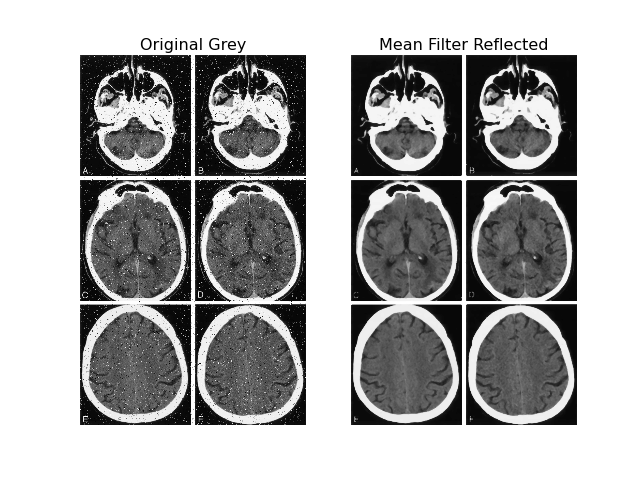

In [15]:
# Performing the median filter.
imgMedianF1 = scipy.ndimage.median_filter(imgSP, size=5) #mode='reflect'

fig, ax = plt.subplots(1,2)
ax[0].imshow(imgSP, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Grey')
ax[0].axis('off')
ax[1].imshow(imgMedianF1, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Mean Filter Reflected')
ax[1].axis('off')

(-0.5, 662.5, 1085.5, -0.5)

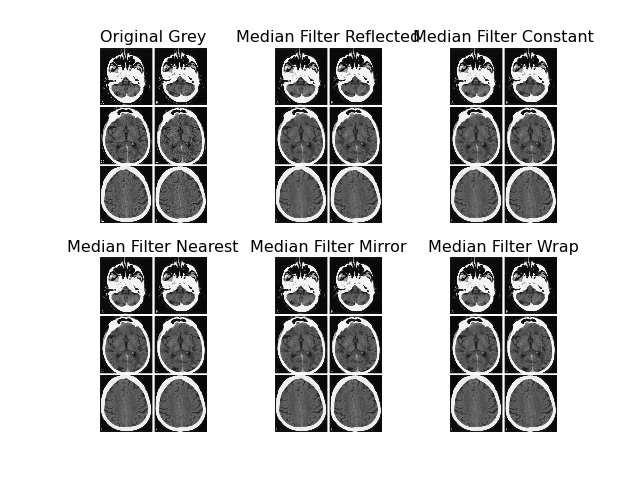

In [16]:
# Utilizando outras técnicas de padding
# {'reflect', 'constant', 'nearest', 'mirror', 'wrap'}
imgMedianF2 = scipy.ndimage.median_filter(imgG, size=5, mode='constant', cval=128)
imgMedianF3 = scipy.ndimage.median_filter(imgG, size=5, mode='nearest' )
imgMedianF4 = scipy.ndimage.median_filter(imgG, size=5, mode='mirror')
imgMedianF5 = scipy.ndimage.median_filter(imgG, size=5, mode='wrap' )

fig, ax = plt.subplots(2,3)
ax[0, 0].imshow(imgG, cmap='gray', vmin=0, vmax=255)
ax[0, 0].set_title('Original Grey')
ax[0, 0].axis('off')
ax[0, 1].imshow(imgMedianF1, cmap='gray', vmin=0, vmax=255)
ax[0, 1].set_title('Median Filter Reflected')
ax[0, 1].axis('off')
ax[0, 2].imshow(imgMedianF2, cmap='gray', vmin=0, vmax=255)
ax[0, 2].set_title('Median Filter Constant')
ax[0, 2].axis('off')
ax[1, 0].imshow(imgMedianF3, cmap='gray', vmin=0, vmax=255)
ax[1, 0].set_title('Median Filter Nearest')
ax[1, 0].axis('off')
ax[1, 1].imshow(imgMedianF4, cmap='gray', vmin=0, vmax=255)
ax[1, 1].set_title('Median Filter Mirror')
ax[1, 1].axis('off')
ax[1, 2].imshow(imgMedianF5, cmap='gray', vmin=0, vmax=255)
ax[1, 2].set_title('Median Filter Wrap')
ax[1, 2].axis('off')

### Filtro de máximo

Este filtro realça os pontos mais brilhantes em uma imagem. Neste filtro o valor máximo na janela, definida pela mascara do filtro,  substitui o valor em (i,j).  No [scipy](https://docs.scipy.org/doc/scipy-1.9.1/reference/generated/scipy.ndimage.maximum_filter.html?highlight=ndimage%20maximum_filter#scipy.ndimage.maximum_filter) está disponível uma implementação eficiente deste filtro. Veja os exemplos a seguir.

In [17]:
help(scipy.ndimage.maximum_filter)

Help on function maximum_filter in module scipy.ndimage._filters:

maximum_filter(input, size=None, footprint=None, output=None, mode='reflect', cval=0.0, origin=0)
    Calculate a multidimensional maximum filter.
    
    Parameters
    ----------
    input : array_like
        The input array.
    size : scalar or tuple, optional
        See footprint, below. Ignored if footprint is given.
    footprint : array, optional
        Either `size` or `footprint` must be defined. `size` gives
        the shape that is taken from the input array, at every element
        position, to define the input to the filter function.
        `footprint` is a boolean array that specifies (implicitly) a
        shape, but also which of the elements within this shape will get
        passed to the filter function. Thus ``size=(n,m)`` is equivalent
        to ``footprint=np.ones((n,m))``.  We adjust `size` to the number
        of dimensions of the input array, so that, if the input array is
        shap

(-0.5, 662.5, 1085.5, -0.5)

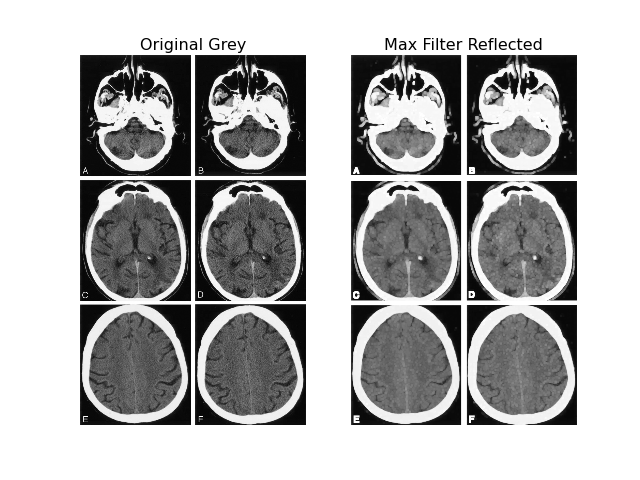

In [18]:
# performing maximum filter
imgMaxF1 = scipy.ndimage.maximum_filter(imgGauss, size=5) #mode='reflect'

fig, ax = plt.subplots(1,2)
ax[0].imshow(imgGauss, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Grey')
ax[0].axis('off')
ax[1].imshow(imgMaxF1, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Max Filter Reflected')
ax[1].axis('off')

(-0.5, 662.5, 1085.5, -0.5)

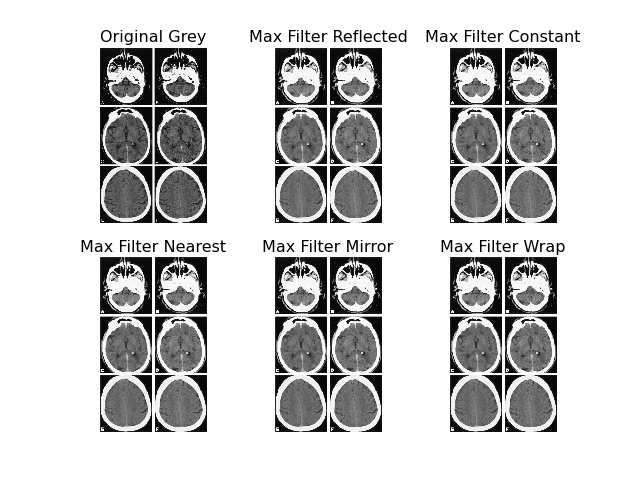

In [19]:
# Utilizando outras técnicas de padding
# {'reflect', 'constant', 'nearest', 'mirror', 'wrap'}
imgMaxF2 = scipy.ndimage.maximum_filter(imgG, size=5, mode='constant', cval=128)
imgMaxF3 = scipy.ndimage.maximum_filter(imgG, size=5, mode='nearest' )
imgMaxF4 = scipy.ndimage.maximum_filter(imgG, size=5, mode='mirror')
imgMaxF5 = scipy.ndimage.maximum_filter(imgG, size=5, mode='wrap' )
#  img is converted from an ndarray to an image
imgMaxF1 = Image.fromarray(imgMaxF1)
imgMaxF2 = Image.fromarray(imgMaxF2)
imgMaxF3 = Image.fromarray(imgMaxF3)
imgMaxF4 = Image.fromarray(imgMaxF4)
imgMaxF5 = Image.fromarray(imgMaxF5)

fig, ax = plt.subplots(2,3)
ax[0, 0].imshow(imgG, cmap='gray', vmin=0, vmax=255)
ax[0, 0].set_title('Original Grey')
ax[0, 0].axis('off')
ax[0, 1].imshow(imgMaxF1, cmap='gray', vmin=0, vmax=255)
ax[0, 1].set_title('Max Filter Reflected')
ax[0, 1].axis('off')
ax[0, 2].imshow(imgMaxF2, cmap='gray', vmin=0, vmax=255)
ax[0, 2].set_title('Max Filter Constant')
ax[0, 2].axis('off')
ax[1, 0].imshow(imgMaxF3, cmap='gray', vmin=0, vmax=255)
ax[1, 0].set_title('Max Filter Nearest')
ax[1, 0].axis('off')
ax[1, 1].imshow(imgMaxF4, cmap='gray', vmin=0, vmax=255)
ax[1, 1].set_title('Max Filter Mirror')
ax[1, 1].axis('off')
ax[1, 2].imshow(imgMaxF5, cmap='gray', vmin=0, vmax=255)
ax[1, 2].set_title('Max Filter Wrap')
ax[1, 2].axis('off')

### Filtro de mínimo

Este filtro é usado para realçar os pontos mais escuros de uma imagem. Neste filtro  o valor mínimo na janela, definida pela mascara do filtro,  substitui o valor em (i,j). No [scipy](https://docs.scipy.org/doc/scipy-1.9.1/reference/generated/scipy.ndimage.minimum_filter.html?highlight=ndimage%20minimum_filter#scipy.ndimage.minimum_filter) está disponível uma implementação eficiente deste filtro. Veja os exemplos a seguir.

In [20]:
help(scipy.ndimage.minimum_filter)

Help on function minimum_filter in module scipy.ndimage._filters:

minimum_filter(input, size=None, footprint=None, output=None, mode='reflect', cval=0.0, origin=0)
    Calculate a multidimensional minimum filter.
    
    Parameters
    ----------
    input : array_like
        The input array.
    size : scalar or tuple, optional
        See footprint, below. Ignored if footprint is given.
    footprint : array, optional
        Either `size` or `footprint` must be defined. `size` gives
        the shape that is taken from the input array, at every element
        position, to define the input to the filter function.
        `footprint` is a boolean array that specifies (implicitly) a
        shape, but also which of the elements within this shape will get
        passed to the filter function. Thus ``size=(n,m)`` is equivalent
        to ``footprint=np.ones((n,m))``.  We adjust `size` to the number
        of dimensions of the input array, so that, if the input array is
        shap

(-0.5, 662.5, 1085.5, -0.5)

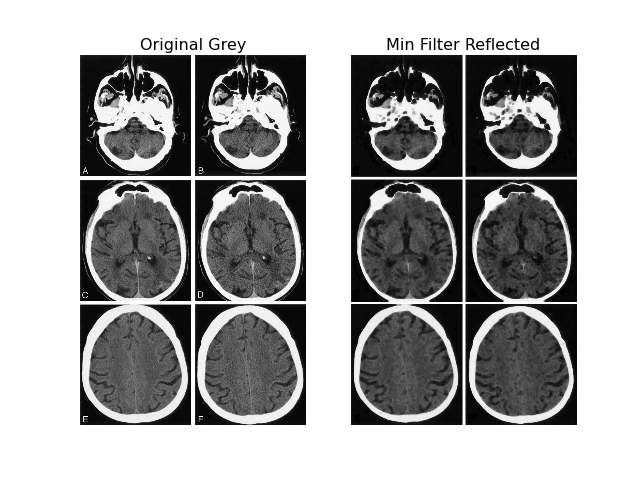

In [21]:
# performing minimum filter
imgMinF1 = scipy.ndimage.minimum_filter(imgG, size=5) #mode='reflect'

fig, ax = plt.subplots(1,2)
ax[0].imshow(imgGauss, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Grey')
ax[0].axis('off')
ax[1].imshow(imgMinF1, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Min Filter Reflected')
ax[1].axis('off')

(-0.5, 662.5, 1085.5, -0.5)

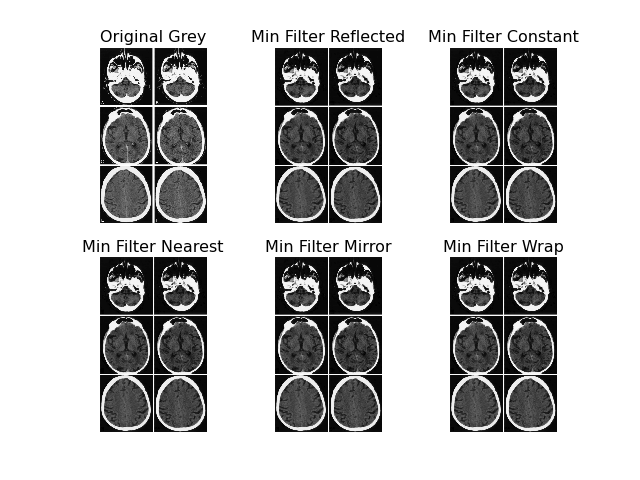

In [22]:
# Utilizando outras técnicas de padding
# {'reflect', 'constant', 'nearest', 'mirror', 'wrap'}
imgMinF2 = scipy.ndimage.minimum_filter(imgG, size=5, mode='constant', cval=128)
imgMinF3 = scipy.ndimage.minimum_filter(imgG, size=5, mode='nearest' )
imgMinF4 = scipy.ndimage.minimum_filter(imgG, size=5, mode='mirror')
imgMinF5 = scipy.ndimage.minimum_filter(imgG, size=5, mode='wrap' )
#  img is converted from an ndarray to an image
imgMinF1 = Image.fromarray(imgMinF1)
imgMinF2 = Image.fromarray(imgMinF2)
imgMinF3 = Image.fromarray(imgMinF3)
imgMinF4 = Image.fromarray(imgMinF4)
imgMinF5 = Image.fromarray(imgMinF5)

fig, ax = plt.subplots(2,3)
ax[0, 0].imshow(imgG, cmap='gray', vmin=0, vmax=255)
ax[0, 0].set_title('Original Grey')
ax[0, 0].axis('off')
ax[0, 1].imshow(imgMinF1, cmap='gray', vmin=0, vmax=255)
ax[0, 1].set_title('Min Filter Reflected')
ax[0, 1].axis('off')
ax[0, 2].imshow(imgMinF2, cmap='gray', vmin=0, vmax=255)
ax[0, 2].set_title('Min Filter Constant')
ax[0, 2].axis('off')
ax[1, 0].imshow(imgMinF3, cmap='gray', vmin=0, vmax=255)
ax[1, 0].set_title('Min Filter Nearest')
ax[1, 0].axis('off')
ax[1, 1].imshow(imgMinF4, cmap='gray', vmin=0, vmax=255)
ax[1, 1].set_title('Min Filter Mirror')
ax[1, 1].axis('off')
ax[1, 2].imshow(imgMinF5, cmap='gray', vmin=0, vmax=255)
ax[1, 2].set_title('Min Filter Wrap')
ax[1, 2].axis('off')

Recapitulando 

(-0.5, 662.5, 1085.5, -0.5)

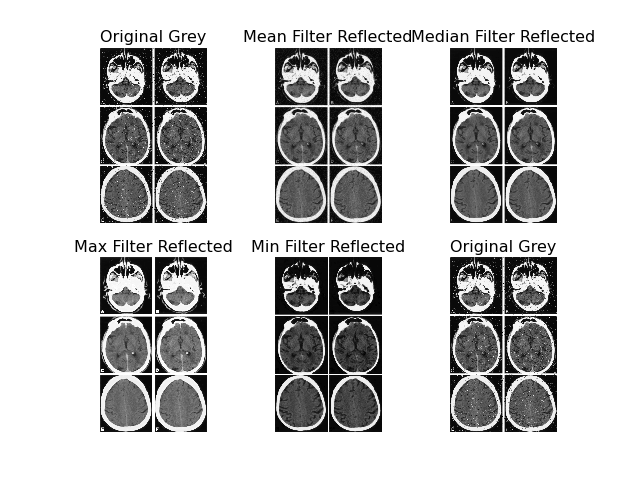

In [23]:
fig, ax = plt.subplots(2,3)
ax[0, 0].imshow(imgSP, cmap='gray', vmin=0, vmax=255)
ax[0, 0].set_title('Original Grey')
ax[0, 0].axis('off')
ax[0, 1].imshow(imgMeanF2, cmap='gray', vmin=0, vmax=255)
ax[0, 1].set_title('Mean Filter Reflected')
ax[0, 1].axis('off')
ax[0, 2].imshow(imgMedianF2, cmap='gray', vmin=0, vmax=255)
ax[0, 2].set_title('Median Filter Reflected')
ax[0, 2].axis('off')
ax[1, 0].imshow(imgMaxF2, cmap='gray', vmin=0, vmax=255)
ax[1, 0].set_title('Max Filter Reflected')
ax[1, 0].axis('off')
ax[1, 1].imshow(imgMinF2, cmap='gray', vmin=0, vmax=255)
ax[1, 1].set_title('Min Filter Reflected')
ax[1, 1].axis('off')
ax[1, 2].imshow(imgSP, cmap='gray', vmin=0, vmax=255)
ax[1, 2].set_title('Original Grey')
ax[1, 2].axis('off')

## Detecção de borda

As bordas são um conjunto de pontos em uma imagem onde há uma mudança de intensidade entre um lado desse ponto e o outro. Do cálculo, sabemos que as mudanças na intensidade podem ser medidas usando a primeira ou a segunda derivada. Primeiro, vamos aprender como as mudanças nas intensidades afetam a primeira e a segunda derivadas considerando uma imagem simples e seu perfil correspondente. Este método formará a base para o uso de filtros de primeira e segunda derivada para detecção de borda.

Na borda de uma região, dentro de uma figura,  temos de forma geral, mudanças bruscas de intensidade. Estas mudanças se refletem também em mudanças na primeira e na segunda derivada da intensidade na região onde a borda acontece. As imagens adquiridas, terão ruídos que podem afetar a detecção do cruzamento de uma região para outra da borda. Além disso, se a intensidade mudar rapidamente no perfil, arestas espúrias podem ser detectadas pelos algoritmos. Para evitar problemas devido a ruído ou mudança rápida de intensidade, a imagem deve ser pré-processada antes da aplicação de um filtro de derivada.

### Filtros de primeira derivada

As imagens não são funções contínuas pelo que suas derivadas so podem ser calculadas utilizando aproximações discretas. As derivadas parciais $f_x = \frac{\partial f}{\partial x}$ e $f_y = \frac{\partial f}{\partial y}$  podem ser utilizadas para determinar o gradiente da função:

$$ \left | \nabla f \right | = [(f_x)^2 + (f_y)^2]^{\frac{1}{2}}$$

Para fins computacionais, pode-se usar a versão simplificada do gradiente e do ângulo dado por: 

$$ \left | \nabla f \right | = \left | f_x \right | + \left | f_y \right |$$

$$ \theta = \tan ^ -1 \left ( \frac{f_x}{f_y} \right )$$




#### Filtro de Sobel

O filtro de Sobel é uma artefato computacional que utiliza a primeira derivada para deteção de borda. Neste filtro se utiliza uma mascara para deteção de bordas verticais e outra para horizontais. Estas mascaras podem ser construídas a partir, por exemplo da utilização da serie de Taylor para funções de duas variáveis. Veja como ficas as mascaras: 

In [24]:
mascHorEdges = np.array([[-1, -2, -1],[0, 0, 0],[1, 2, 1]])
print(mascHorEdges)
mascVerEdges = np.array([[-1, 0, 1],[-2, 0, 2],[1, 0, -1]])
print(mascVerEdges)

[[-1 -2 -1]
 [ 0  0  0]
 [ 1  2  1]]
[[-1  0  1]
 [-2  0  2]
 [ 1  0 -1]]


As principais características do filtro Sobel são:

• A soma dos coeficientes na imagem da máscara é 0. Isso significa que os pixels com escala de cinza constante não são afetados pelo filtro.

• O efeito colateral dos filtros de derivada é a criação de ruído adicional. Portanto, coeficientes de +2 e -2 são usados na imagem da máscara para suavizar e diminuir o ruído.

Veja a implementação do filtro de Sobel no [scikits](https://scikit-image.org/docs/stable/api/skimage.filters.html#skimage.filters.sobel)


In [25]:
help(filters.sobel)

Help on function sobel in module skimage.filters.edges:

sobel(image, mask=None, *, axis=None, mode='reflect', cval=0.0)
    Find edges in an image using the Sobel filter.
    
    Parameters
    ----------
    image : array
        The input image.
    mask : array of bool, optional
        Clip the output image to this mask. (Values where mask=0 will be set
        to 0.)
    axis : int or sequence of int, optional
        Compute the edge filter along this axis. If not provided, the edge
        magnitude is computed. This is defined as::
    
            sobel_mag = np.sqrt(sum([sobel(image, axis=i)**2
                                     for i in range(image.ndim)]) / image.ndim)
    
        The magnitude is also computed if axis is a sequence.
    mode : str or sequence of str, optional
        The boundary mode for the convolution. See `scipy.ndimage.convolve`
        for a description of the modes. This can be either a single boundary
        mode or one boundary mode per axis

(-0.5, 662.5, 1085.5, -0.5)

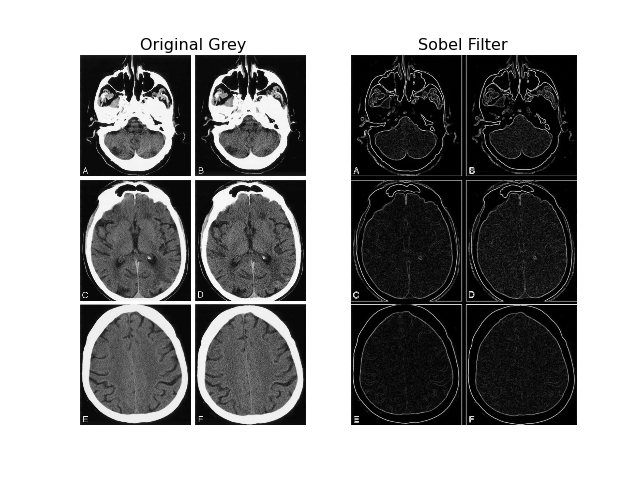

In [26]:
# Performing Sobel filter.
imgSobel = filters.sobel(imgG)

fig, ax = plt.subplots(1,2)
ax[0].imshow(imgG, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Grey')
ax[0].axis('off')
ax[1].imshow(imgSobel, cmap='gray')
ax[1].set_title('Sobel Filter')
ax[1].axis('off')

#### Filtro Prewitt
Outro filtro de primeira derivada popular é o Prewitt. As máscaras para o filtro Prewitt são dadas por:


In [27]:
mascHorEdges = np.array([[-1, -1, -1],[0, 0, 0],[1, 1, 1]])
print(mascHorEdges)
mascVerEdges = np.array([[-1, 0, 1],[-1, 0, 1],[1, 0, -1]])
print(mascVerEdges)

[[-1 -1 -1]
 [ 0  0  0]
 [ 1  1  1]]
[[-1  0  1]
 [-1  0  1]
 [ 1  0 -1]]


Como no caso do filtro Sobel, a soma dos coeficientes em Prewitt também é 0. Portanto, este filtro não afeta os pixels com escala de cinza constante. No entanto, o filtro não reduz o ruído como o filtro Sobel.

In [28]:
help(filters.prewitt)

Help on function prewitt in module skimage.filters.edges:

prewitt(image, mask=None, *, axis=None, mode='reflect', cval=0.0)
    Find the edge magnitude using the Prewitt transform.
    
    Parameters
    ----------
    image : array
        The input image.
    mask : array of bool, optional
        Clip the output image to this mask. (Values where mask=0 will be set
        to 0.)
    axis : int or sequence of int, optional
        Compute the edge filter along this axis. If not provided, the edge
        magnitude is computed. This is defined as::
    
            prw_mag = np.sqrt(sum([prewitt(image, axis=i)**2
                                   for i in range(image.ndim)]) / image.ndim)
    
        The magnitude is also computed if axis is a sequence.
    mode : str or sequence of str, optional
        The boundary mode for the convolution. See `scipy.ndimage.convolve`
        for a description of the modes. This can be either a single boundary
        mode or one boundary mode 

(-0.5, 662.5, 1085.5, -0.5)

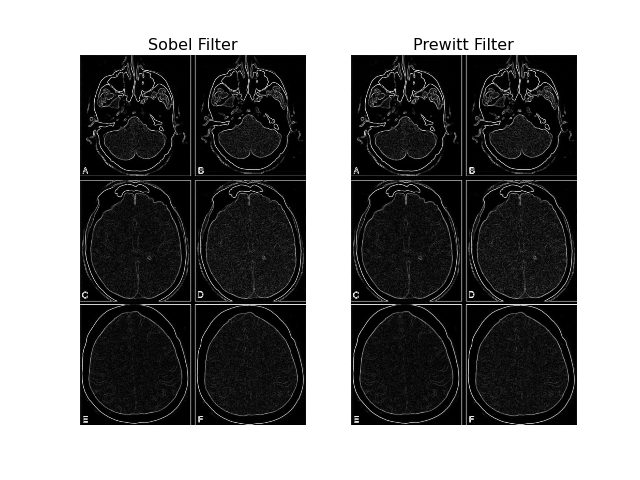

In [29]:
# Performing Prewitt and Sobel filter.
imgPrewitt = filters.prewitt(imgG)

fig, ax = plt.subplots(1,2)
ax[0].imshow(imgSobel, cmap='gray')
ax[0].set_title('Sobel Filter')
ax[0].axis('off')
ax[1].imshow(imgPrewitt, cmap='gray')
ax[1].set_title('Prewitt Filter')
ax[1].axis('off')

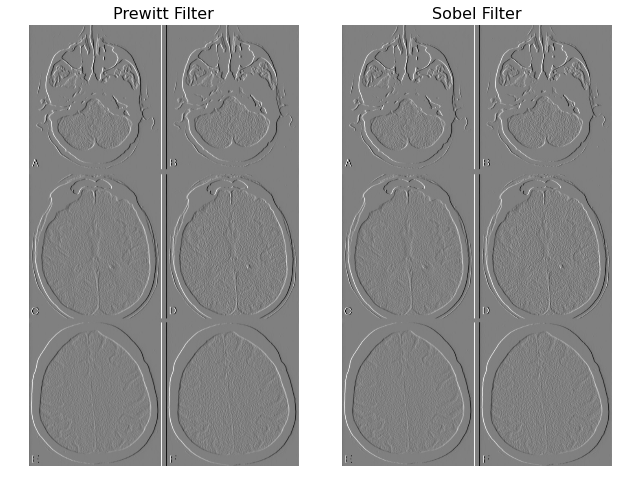

In [30]:
# Performing Prewitt and Sobel Vertical filter.
imgPrewitt = filters.prewitt_v(imgG)
imgSobel = filters.sobel_v(imgG)

fig, ax = plt.subplots(1,2)
ax[0].imshow(imgPrewitt, cmap='gray')
ax[0].set_title('Prewitt Filter')
ax[0].axis('off')
ax[1].imshow(imgSobel, cmap='gray')
ax[1].set_title('Sobel Filter')
ax[1].axis('off')
plt.tight_layout()

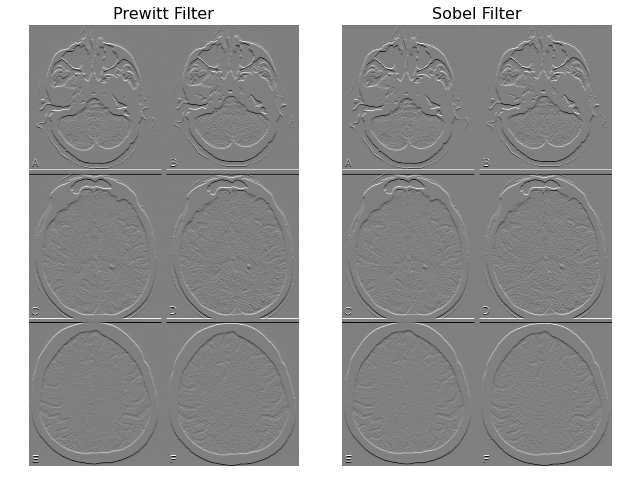

In [31]:
# Performing Prewitt and Sobel Horizontal filter.
imgPrewitt = filters.prewitt_h(imgG)
imgSobel = filters.sobel_h(imgG)

fig, ax = plt.subplots(1,2)
ax[0].imshow(imgPrewitt, cmap='gray')
ax[0].set_title('Prewitt Filter')
ax[0].axis('off')
ax[1].imshow(imgSobel, cmap='gray')
ax[1].set_title('Sobel Filter')
ax[1].axis('off')
plt.tight_layout()

#### Filtro Canny

Outro filtro popular para detecção de bordas é o filtro Canny ou detector de bordas Canny. Este filtro usa três parâmetros para detectar arestas. O primeiro parâmetro é o desvio padrão, $\sigma$, para o filtro gaussiano. O segundo e o terceiro parâmetros são os limiares, $t_1$ e $t_2$. De forma resumida o filtro Canny pode ser descrito pelas seguintes etapas:
1. Um filtro gaussiano é usado na imagem para suavização.
2. Uma propriedade importante de um pixel de borda é que ele terá um magnitude máxima do gradiente na direção do gradiente. Então, para cada pixel, a magnitude do gradiente e a direção correspondente, $\theta$, são computadas.
3. Nos pontos de borda, a primeira derivada terá um mínimo ou um máximo. Isso implica que a magnitude (valor absoluto) do gradiente da imagem nos pontos de borda é máxima. Vamos nos referir a esses pontos como pixels de crista. Para identificar pontos de borda e suprimir outros, apenas os topos das cristas são retidos e outros pixels recebem um valor de zero. Este processo é conhecido como supressão não máxima.
4. Dois limiares, limiar baixo e limiar alto, são então usados para limitar as cristas. Os valores de pixel de cume ajudam a classificar os pixels de borda em fracos e fortes. Os pixels da crista com valores maiores que o limiar alto são classificados como pixels de aresta forte, enquanto os pixels da aresta entre o limiar baixo e o limiar alto são chamados de pixels de aresta fracos.
5. Na última etapa, os pixels de borda fraca são conectados em 8 com os pixels de borda forte.

Veja uma explicação mais detalhada na [aqui](https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html)

In [32]:
help(cv.Canny)

Help on built-in function Canny:

Canny(...)
    Canny(image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]]) -> edges
    .   @brief Finds edges in an image using the Canny algorithm @cite Canny86 .
    .   
    .   The function finds edges in the input image and marks them in the output map edges using the
    .   Canny algorithm. The smallest value between threshold1 and threshold2 is used for edge linking. The
    .   largest value is used to find initial segments of strong edges. See
    .   <http://en.wikipedia.org/wiki/Canny_edge_detector>
    .   
    .   @param image 8-bit input image.
    .   @param edges output edge map; single channels 8-bit image, which has the same size as image .
    .   @param threshold1 first threshold for the hysteresis procedure.
    .   @param threshold2 second threshold for the hysteresis procedure.
    .   @param apertureSize aperture size for the Sobel operator.
    .   @param L2gradient a flag, indicating whether a more accurate \

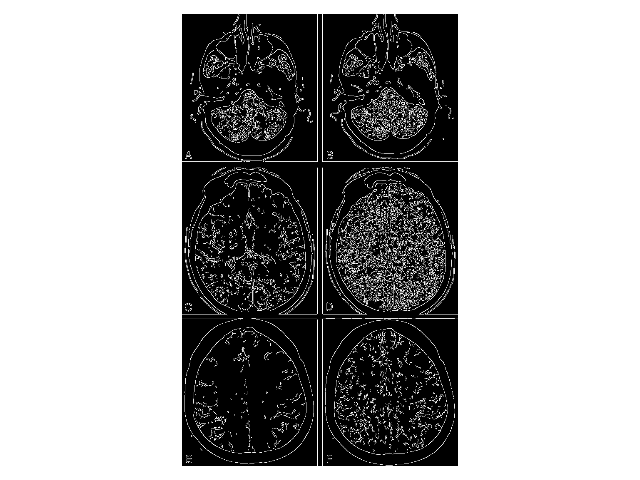

In [33]:
# Performing Canny edge filter.
imgCanny = cv.Canny(imgG, 100, 200)

fig = plt.figure()
ax = plt.axes()
ax.imshow(imgCanny, 'gray')
ax.axis('off')
plt.tight_layout()

#### Filtro de Laplaciano

Um dos filtros de segunda derivada mais populares é o Laplaciano. O Laplaciano de uma função contínua é dado por:

$$\nabla ^2 f = \frac {\partial ^2 f}{\partial x ^2} + \frac {\partial ^2 f}{\partial y ^2}  $$

onde $\frac {\partial ^2 f}{\partial x ^2}$  é a segunda derivada parcial de $f$ na direção $x$  e representa uma mudança de $\frac {\partial f}{\partial x}$ ao longo da direção horizontal e $\frac {\partial ^2 f}{\partial y ^2}$ é a segunda derivada parcial de $f$ na direção $y$  e representa uma mudança de $\frac {\partial f}{\partial y}$ ao longo da direção vertical. O Laplaciano discreto usado para processamento de imagem tem várias versões. Veja duas das mascaras mais utilizadas:

In [34]:
mascLap_1 = np.array([[0, 1, 0],[-1, 4, -1],[0, -1, 0]])
print(mascLap_1)
mascLap_2 = np.array([[-1, -1, -1],[-1, 8, 1],[-1, -1, -1]])
print(mascLap_2)

[[ 0  1  0]
 [-1  4 -1]
 [ 0 -1  0]]
[[-1 -1 -1]
 [-1  8  1]
 [-1 -1 -1]]


In [35]:
help(scipy.ndimage.laplace)

Help on function laplace in module scipy.ndimage._filters:

laplace(input, output=None, mode='reflect', cval=0.0)
    N-D Laplace filter based on approximate second derivatives.
    
    Parameters
    ----------
    input : array_like
        The input array.
    output : array or dtype, optional
        The array in which to place the output, or the dtype of the
        returned array. By default an array of the same dtype as input
        will be created.
    mode : str or sequence, optional
        The `mode` parameter determines how the input array is extended
        when the filter overlaps a border. By passing a sequence of modes
        with length equal to the number of dimensions of the input array,
        different modes can be specified along each axis. Default value is
        'reflect'. The valid values and their behavior is as follows:
    
        'reflect' (`d c b a | a b c d | d c b a`)
            The input is extended by reflecting about the edge of the last
     

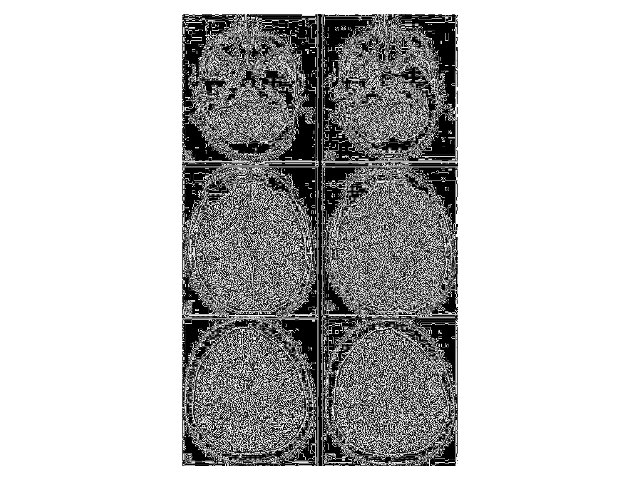

In [36]:
# Performing Laplacian filter.
imgLaplace = scipy.ndimage.laplace(imgG)

fig = plt.figure()
ax = plt.axes()
ax.imshow(imgLaplace, 'gray')
ax.axis('off')
plt.tight_layout()

Conforme discutido anteriormente, um filtro baseado no uso da derivada da função adiciona ruído a uma imagem. O efeito é amplificado quando a imagem da primeira derivada é diferenciada novamente para obter a segunda derivada. Como existem várias arestas na imagem de entrada, o filtro Laplaciano super-segmenta o objeto (cria muitas arestas) como visto na saída. Isso resulta em uma imagem ruidosa sem bordas discerníveis.

#### Laplaciano do Filtro Gaussiano

Para compensar o efeito de ruído do laplaciano, uma função de suavização, gaussiana, é usada junto com o laplaciano. Enquanto o laplaciano calcula o cruzamento zero e determina as arestas, o gaussiano suaviza o ruído induzido pela segunda derivada.

A função Gaussiana é dada por

$$ G(r) = -e ^ {\frac{-r ^2}{2 \sigma ^2}}$$

onde $r ^2=x ^2 + y ^2$ e $\sigma$ é o desvio padrão. Uma convolução de uma imagem com o gaussiano resultará na suavização da imagem. O $\sigma$ determina a magnitude da suavização. Se $\sigma$ for grande, haverá mais suavização, o que faz com que as arestas importantes fiquem borradas. Valores menores de $\sigma$ produzem uma suavização menor.

O Laplaciano convoluído com Gaussiano é conhecido como Laplaciano de Gaussiano e é denotado por LoG. A mascara é dada por:

In [37]:
mascLoG = np.array([[0, 0, -1, 0, 0], 
           [0, -1, -2, -1, 0], 
           [-1, -2, 16, -2, -1], 
           [0, -1, -2, -1, 0], 
           [0, 0, -1, 0, 0] ])
print(mascLoG)

[[ 0  0 -1  0  0]
 [ 0 -1 -2 -1  0]
 [-1 -2 16 -2 -1]
 [ 0 -1 -2 -1  0]
 [ 0  0 -1  0  0]]


In [38]:
help(scipy.ndimage.gaussian_laplace)

Help on function gaussian_laplace in module scipy.ndimage._filters:

gaussian_laplace(input, sigma, output=None, mode='reflect', cval=0.0, **kwargs)
    Multidimensional Laplace filter using Gaussian second derivatives.
    
    Parameters
    ----------
    input : array_like
        The input array.
    sigma : scalar or sequence of scalars
        The standard deviations of the Gaussian filter are given for
        each axis as a sequence, or as a single number, in which case
        it is equal for all axes.
    output : array or dtype, optional
        The array in which to place the output, or the dtype of the
        returned array. By default an array of the same dtype as input
        will be created.
    mode : str or sequence, optional
        The `mode` parameter determines how the input array is extended
        when the filter overlaps a border. By passing a sequence of modes
        with length equal to the number of dimensions of the input array,
        different modes

/var/folders/k8/m4nwfbmx7517ksbqt7fkxclm0000gn/T/ipykernel_3136/1018596161.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,2)


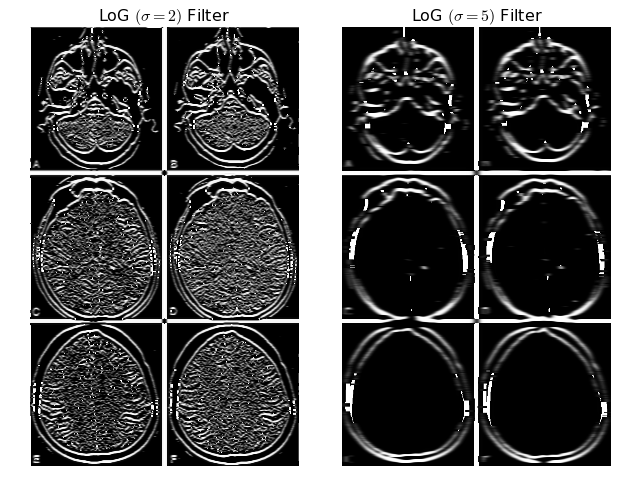

In [39]:
# Performing Laplacian of Gaussian.
imgLoG_s2 = scipy.ndimage.gaussian_laplace(imgG, sigma=2)
imgLoG_s5 = scipy.ndimage.gaussian_laplace(imgG, sigma=5)

fig, ax = plt.subplots(1,2)
ax[0].imshow(imgLoG_s2, cmap='gray')
ax[0].set_title('LoG $(\sigma = 2)$ Filter')
ax[0].axis('off')
ax[1].imshow(imgLoG_s5, cmap='gray')
ax[1].set_title('LoG $(\sigma = 5)$ Filter')
ax[1].axis('off')
plt.tight_layout()